<h1><center>Microsoft Engage 2022</center></h1>


### Hello, I am Armesha Sharma, B.Tech. 2nd Year student of IGDTUW trying to develop an application to demonstrate how the Automotive Industry could harness data to take informed decisions.

# Objective 
The main objective of this report is to be able to identify the strategic group of a car given a set of features to that car.
Although there are 140 features in the given dataset yet it will not be feasible to take into account all the features. So, I am going with the selection determined by Mr. Muhammad M. EL.Shernini on Kaggle with a lot of thanks to him to make my work easy. 


#### The Car we want to identify the strategic group for is Maruti Suzuki Swift which is one of the most popular car in india.  

Altough, these days people are inclined towards costly cars viz. BMW, Audi, Mercedese and even Jaguar yet these are not ruling the market because market is made up of people and the population in India is made up of middle class which has certain characteristics viz. hoping everything with minimal cost. Maruti has fulfilled the need of Indian population. So it will be appropriate to study the strategy keeping in middle the Swift model of the Maruti Suzuki.  
Maruti Suzuki is the biggest player in the Indian Car Market. Its reach can be found in the remote villages and even in the far flung areas of India. we can come up with some intution and common scence like the popularity (so called "Market Value") of Maruti car is due to the familierty of its parts by the Mechanics, who are available everywhere and its affordability. 

<center><img src='https://cdni.autocarindia.com/Utils/ImageResizer.ashx?n=http://cms.haymarketindia.net/model/uploads/modelimages/Maruti-Suzuki-Swift-100320211204.jpg&w=730&h=484&q=75&c=1'></center>

Among various models of Maruti Suzuki we will focus on the Swift model. The Swift is a Nation wide best seller and it has been sold for many years, but as the automotive market became full of comptitiors an extensive analysis is needed to identifiy the strategic group competing with the company in the market

### Approach 
I have used the given dataset viz cars_engage_2022. I have found the similar data analysis by Mr. Muhammad M. EL.Shernini on Kaggle. Taking help from his work of cleaning data, I am trying to highlight some other aspects of the analysis. This report will follow a mathematical approach using a method called clustring to achive the objective of identifying strategic group. 
##### The K-Means Clustring, provide a way to group even unstructured data like the given dataset. Elbow method has been used to find the appropriate value for 'k'.

<h3><center>Strategic grouping</center></h3>


#### This notebook will go through the strategic grouping phase of competitive analysis to define the strategic groups within the automotive industry in india using a mathematical methodology.



<center><img src='https://bernardmarr.com/wp-content/uploads/2021/07/the-10-biggest-strategy-mistakes-companies-make.png' width='520' height="520" ></center>



**[A strategic group](https://en.wikipedia.org/wiki/Strategic_group)** is a concept used in strategic management that groups companies within an industry that have similar business models or similar combinations of strategies. For example, the restaurant industry can be divided into several strategic groups including fast-food and fine-dining based on variables such as preparation time, pricing, and presentation. The number of groups within an industry and their composition depends on the dimensions used to define the groups. Strategic management professors and consultants often make use of a two dimensional grid to position firms along an industry's two most important dimensions in order to distinguish direct rivals (those with similar strategies or business models) from indirect rivals. 

## Challenge


The automotive industry is one of the largest industries out there it's a [2.6 trillion dollar industry](https://www.ibisworld.com/global/market-size/global-car-automobile-manufacturing/)! 


But inside the industry there are too many categories and subcategories constructed by too many variables that it almost safe to say that every category is an industry of itself.
for instance the car body variable is a vital one, as diffrernt body types are being used for very different reason here is a list of some car body type:
- SEDAN
- COUPE
- STATION WAGON
- HATCHBACK
- CONVERTIBLE
- SPORT-UTILITY VEHICLE (SUV)
- MINIVAN



#### And this just to name a few!, here is a [photo](http://carsonelove.com/car-body-types#prettyPhoto) show some of car types in more details

<center><img src='http://carsonelove.com/wp-content/uploads/2014/01/Type-of-Cars.jpg' width='620' height='620'></center>


And all of the varieties above are only regarding the car body type, which is only one variable!, not to mention that there are grey areas where some car body types can be irrelevant to customer decision.
#### So for a car company it's really a challenge to identify its strategic group as it really takes a lot of effort to put all variable in consideration.

# Data

The dataset, cars_engage_2022.csv used in this report is having the latest information about cars in the Indian market. The dataset contains cars with their variants, In dataset there are 1200+ model/variants to study. There is a variety of Makes/Models which can be studied, All prices has been converted from indian rupee to USD, The dataset has updated information till 4th June 2020.

<font color='red'>P.S the prices provided here is neither collected nor checked by the author of this notebook, also this report is for educational purposes only.</font>

### This report will have to main part
- [Exploratory Data analysis](#EDA)
- [Clustering of car data.](#clus)

In [1]:
# imports
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 150)
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')
import plotly.express as px
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore');

# Loading data and cleaning data

In [2]:
df = pd.read_csv('../cars_engage_2022.csv',index_col=0)

### here is a sample of the data

In [3]:
df.sample(5)

,Make,Model,Variant,Ex-Showroom_Price,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Emission_Norm,Engine_Location,Fuel_System,Fuel_Tank_Capacity,Fuel_Type,Height,Length,Width,Body_Type,Doors,City_Mileage,Highway_Mileage,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Brakes,Rear_Brakes,Front_Suspension,Rear_Suspension,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power_Steering,Power_Windows,Power_Seats,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seating_Capacity,Seats_Material,Type,Wheelbase,Wheels_Size,Start_/_Stop_Button,12v_Power_Outlet,Audiosystem,Aux-in_Compatibility,Average_Fuel_Consumption,Basic_Warranty,Bluetooth,Boot-lid_Opener,Boot_Space,CD_/_MP3_/_DVD_Player,Central_Locking,Child_Safety_Locks,Clock,Cup_Holders,Distance_to_Empty,Door_Pockets,Engine_Malfunction_Light,Extended_Warranty,FM_Radio,Fuel-lid_Opener,Fuel_Gauge,Handbrake,Instrument_Console,Low_Fuel_Warning,Minimum_Turning_Radius,Multifunction_Display,Sun_Visor,Third_Row_AC_Vents,Ventilation_System,Auto-Dimming_Rear-View_Mirror,Hill_Assist,Gear_Indicator,3_Point_Seat-Belt_in_Middle_Rear_Seat,Ambient_Lightning,Cargo/Boot_Lights,Drive_Modes,Engine_Immobilizer,High_Speed_Alert_System,Lane_Watch_Camera/_Side_Mirror_Camera,Passenger_Side_Seat-Belt_Reminder,Seat_Back_Pockets,Voice_Recognition,Walk_Away_Auto_Car_Lock,ABS_(Anti-lock_Braking_System),Headlight_Reminder,Adjustable_Headrests,Gross_Vehicle_Weight,Airbags,Door_Ajar_Warning,EBD_(Electronic_Brake-force_Distribution),Fasten_Seat_Belt_Warning,Gear_Shift_Reminder,Number_of_Airbags,Compression_Ratio,Adjustable_Steering_Column,Other_Specs,Other_specs,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Android_Auto,Apple_CarPlay,Cigarette_Lighter,Infotainment_Screen,Multifunction_Steering_Wheel,Average_Speed,EBA_(Electronic_Brake_Assist),Seat_Height_Adjustment,Navigation_System,Second_Row_AC_Vents,Tyre_Pressure_Monitoring_System,Rear_Center_Armrest,iPod_Compatibility,ESP_(Electronic_Stability_Program),Cooled_Glove_Box,Recommended_Tyre_Pressure,Heated_Seats,Turbocharger,ISOFIX_(Child-Seat_Mount),Rain_Sensing_Wipers,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
602,Renault,Lodgy,85 Ps Rxe 7 Seater,"Rs. 9,64,199",1461 cc,4.0,4.0,FWD (Front Wheel Drive),In-line,BS IV,"Front, Transverse",Injection,50 litres,Diesel,1697 mm,4498 mm,1751 mm,MUV,4.0,21.04 km/litre,NaN,21.04 km/litre,NaN,1299 kg,5,174 mm,Ventilated Disc,Drum,NaN,Torsion Beam with Anti roll bars,1490 mm,1478 mm,185 / 65 R15,185 / 65 R15,Electro-Hydraulic,All Windows,NaN,Remote,85PS@3750rpm,200Nm@1900rpm,Digital,Analog,Analog,Yes,7.0,Fabric,Manual,2810 mm,R15,NaN,2,Not on offer,NaN,Yes,2 years /50000 Kms (years/distance whichever c...,NaN,Internal,207 litres,NaN,Yes,Yes,Digital,Front,Yes,Front,NaN,1 years /30000 Kms (years/distance whichever c...,NaN,Internal,Digital,Manual,Analog + Digital,Yes,5.55 meter,Yes,Driver & Front Passenger,Yes,Manual Air conditioning with cooling and heating,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,Yes,1338 kg,NaN,Yes,Yes,Yes,NaN,NaN,NaN,Rake,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
284,Jaguar,Xf,2.0 Pure Diesel,"Rs. 49,77,080",1999 cc,4.0,4.0,RWD (Rear Wheel Drive),V,BS IV,"Front, Longitudinal",Injection,66 litres,Diesel,1457 mm,5067 mm,2091 mm,Sedan,4.0,5.7 km/litre,19.33 km/litre,19.33 km/litre,NaN,1687 kg,8,NaN,Ventilated Disc,Ventilated Disc,Adaptive Dynamics system,Adaptive Dynamics system,1605 mm,1594 mm,235/55R17,235/55R17,Electric Power,All Windows,Yes,NaN,180ps@5500rpm,430Nm@1750-2000rpm,Analog,Analog,Analog,Yes,5.0,Leather,Automatic,2960 mm,235/55R17,Yes,Yes,CD/MP3/DVD Player with USB & Aux-in,Yes,Yes,"3 Years/1,00,000 Kms (Whichever comes earlier)",Yes,Man

#### Since the dataset is full of features, we will choose only a subset of  useful features to work with, also we will clean the data to extract useful information

In [4]:
df['car'] = df.Make + ' ' + df.Model
c = ['Make','Model','car','Variant','Body_Type','Fuel_Type','Fuel_System','Type','Drivetrain','Ex-Showroom_Price','Displacement','Cylinders',
     'ARAI_Certified_Mileage','Power','Torque','Fuel_Tank_Capacity','Height','Length','Width','Doors','Seating_Capacity','Wheelbase','Number_of_Airbags']
df_full = df.copy()
df['Ex-Showroom_Price'] = df['Ex-Showroom_Price'].str.replace('Rs. ','',regex=False)
df['Ex-Showroom_Price'] = df['Ex-Showroom_Price'].str.replace(',','',regex=False)
df['Ex-Showroom_Price'] = df['Ex-Showroom_Price'].astype(int)
df = df[c]
df = df[~df.ARAI_Certified_Mileage.isnull()]
df = df[~df.Make.isnull()]
df = df[~df.Width.isnull()]
df = df[~df.Cylinders.isnull()]
df = df[~df.Wheelbase.isnull()]
df = df[~df['Fuel_Tank_Capacity'].isnull()]
df = df[~df['Seating_Capacity'].isnull()]
df = df[~df['Torque'].isnull()]
df['Height'] = df['Height'].str.replace(' mm','',regex=False).astype(float)
df['Length'] = df['Length'].str.replace(' mm','',regex=False).astype(float)
df['Width'] = df['Width'].str.replace(' mm','',regex=False).astype(float)
df['Wheelbase'] = df['Wheelbase'].str.replace(' mm','',regex=False).astype(float)
df['Fuel_Tank_Capacity'] = df['Fuel_Tank_Capacity'].str.replace(' litres','',regex=False).astype(float)
df['Displacement'] = df['Displacement'].str.replace(' cc','',regex=False)
df.loc[df.ARAI_Certified_Mileage == '9.8-10.0 km/litre','ARAI_Certified_Mileage'] = '10'
df.loc[df.ARAI_Certified_Mileage == '10kmpl km/litre','ARAI_Certified_Mileage'] = '10'
df['ARAI_Certified_Mileage'] = df['ARAI_Certified_Mileage'].str.replace(' km/litre','',regex=False).astype(float)
df.Number_of_Airbags.fillna(0,inplace= True)
df['price'] = df['Ex-Showroom_Price'] * 0.014
df.drop(columns='Ex-Showroom_Price', inplace= True)
df.price = df.price.astype(int)
HP = df.Power.str.extract(r'(\d{1,4}).*').astype(int) * 0.98632
HP = HP.apply(lambda x: round(x,2))
TQ = df.Torque.str.extract(r'(\d{1,4}).*').astype(int)
TQ = TQ.apply(lambda x: round(x,2))
df.Torque = TQ
df.Power = HP
df.Doors = df.Doors.astype(int)
df.Seating_Capacity = df.Seating_Capacity.astype(int)
df.Number_of_Airbags = df.Number_of_Airbags.astype(int)
df.Displacement = df.Displacement.astype(int)
df.Cylinders = df.Cylinders.astype(int)
df.columns = ['make', 'model','car', 'variant', 'body_type', 'fuel_type', 'fuel_system','type', 'drivetrain', 'displacement', 'cylinders',
              'mileage', 'power', 'torque', 'fuel_tank','height', 'length', 'width', 'doors', 'seats', 'wheelbase','airbags', 'price']

<a id='EDA'></a>
# Exploratory Data analysis


### Now We check a sample of dataset after cleaning it

In [5]:
df.sample(5)

,make,model,car,variant,body_type,fuel_type,fuel_system,type,drivetrain,displacement,cylinders,mileage,power,torque,fuel_tank,height,length,width,doors,seats,wheelbase,airbags,price
18,Renault,Kwid,Renault Kwid,Rxt Amt 1.0,Hatchback,Petrol,Injection,Automatic,FWD (Front Wheel Drive),999,3,24.04,67.07,91,28.0,1490.0,3731.0,1579.0,5,5,2422.0,1,6486
285,Audi,A3 Cabriolet,Audi A3 Cabriolet,40 Tfsi,Convertible,Petrol,Injection,Automatic,FWD (Front Wheel Drive),1395,4,19.20,145.98,250,50.0,1409.0,4421.0,1793.0,2,4,2595.0,7,70532
936,Maruti Suzuki,Ertiga,Maruti Suzuki Ertiga,1.5L Zdi,MPV,Diesel,Injection,Manual,FWD (Front Wheel Drive),1498,4,24.20,93.70,225,45.0,1690.0,4395.0,1735.0,5,7,2740.0,2,14975
896,Ford,Figo,Ford Figo,Titanium 1.2 Ti-Vct,Hatchback,Petrol,Injection,Manual,FWD (Front Wheel Drive),1196,4,20.40,94.69,120,42.0,1525.0,3941.0,1704.0,5,5,2490.0,2,8398
377,Maruti Suzuki,Celerio,Maruti Suzuki Celerio,Lxi,Hatchback,Petrol,Injection,Manual,FWD (Front Wheel Drive),998,3,23.10,67.07,90,35.0,1560.0,3600.0,1600.0,5,5,2425.0,0,5968


## Now we check the distribution of some features in the dataset
### First we Check the price distribution, we will use both normal and log scales due to the huge difference in prices.

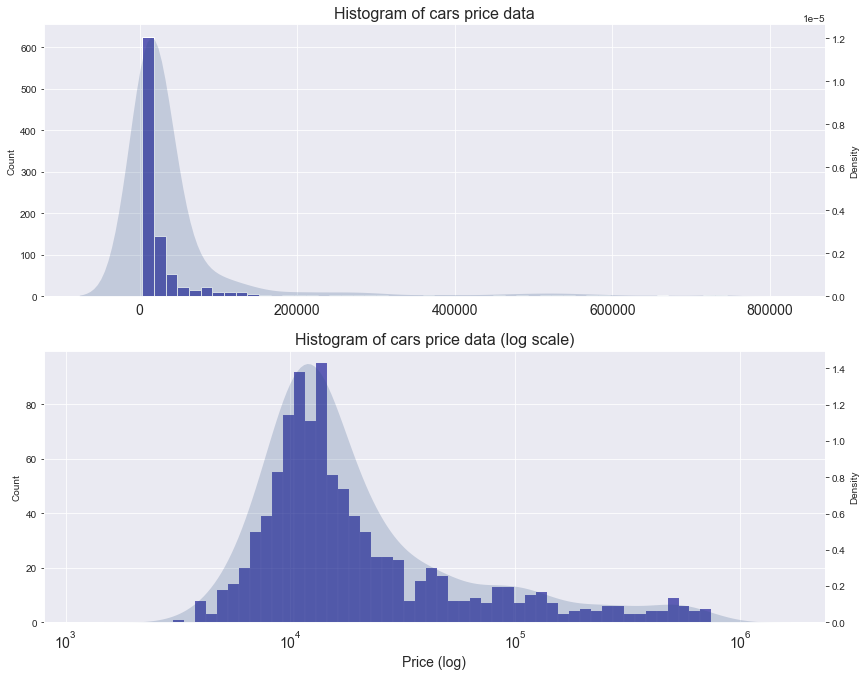

In [6]:
fig,(ax1,ax2) = plt.subplots(2,1,figsize=(14,11))
sns.histplot(data=df, x='price',bins=50, alpha=.6, color='darkblue', ax=ax1)
ax12 = ax1.twinx()
sns.kdeplot(data=df, x='price', alpha=.2,fill= True,color="#254b7f",ax=ax12,linewidth=0)
ax12.grid()
ax1.set_title('Histogram of cars price data',fontsize=16)
ax1.set_xlabel('')
logbins = np.logspace(np.log10(3000),np.log10(744944.578),50)
sns.histplot(data=df, x='price',bins=logbins,alpha=.6, color='darkblue',ax=ax2)
ax2.set_title('Histogram of cars price data (log scale)',fontsize=16)
ax2.set_xscale('log')
ax22 = ax2.twinx()
ax22.grid()
sns.kdeplot(data=df, x='price', alpha=.2,fill= True,color="#254b7f",ax=ax22,log_scale=True,linewidth=0)
ax2.set_xlabel('Price (log)', fontsize=14)
ax22.set_xticks((800,1000,10000,100000,1000000))
ax2.xaxis.set_tick_params(labelsize=14);
ax1.xaxis.set_tick_params(labelsize=14);

#### Seems like there is a lot of varaince in price we can check that by plotting a box plot 

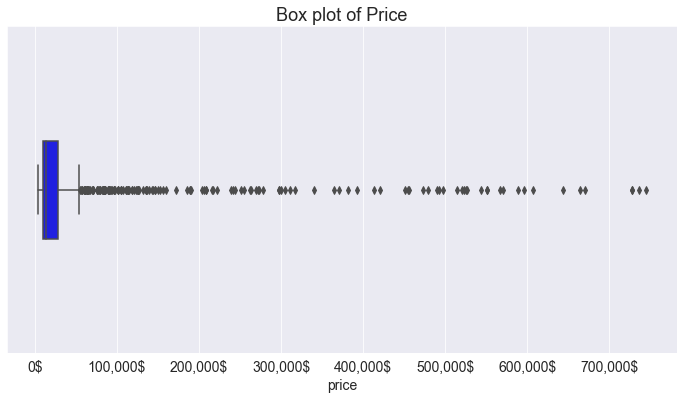

In [7]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df, x='price',width=.3,color='blue', hue= 'fuel_type')
plt.title('Box plot of Price',fontsize=18)
plt.xticks([i for i in range(0,800000,100000)],[f'{i:,}$' for i in range(0,800000,100000)],fontsize=14)
plt.xlabel('price',fontsize=14);

> #### Seems that there is a lot of outliers that form a very different type(s) of cars or to be mor exact there are very different categories in the automotive market

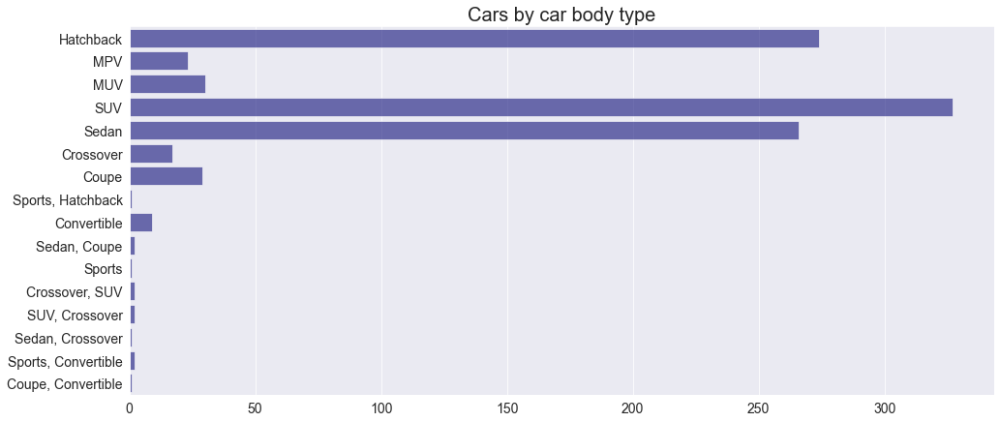

In [8]:
plt.figure(figsize=(16,7))
sns.countplot(data=df, y='body_type',alpha=.6,color='darkblue')
plt.title('Cars by car body type',fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('')
plt.ylabel('');

### Now, We will make a dataframe of the car "Maruti Suzuki" i.e. df1 and compare the same with compressed features of the dataframe df. I have scaled down because the price of Maruti are comparably very less. 

In [9]:
df1 = df[df.make =='Maruti Suzuki']
print(df.shape)
print(df1.shape)
df1.sample(4)

(987, 23)
(143, 23)


,make,model,car,variant,body_type,fuel_type,fuel_system,type,drivetrain,displacement,cylinders,mileage,power,torque,fuel_tank,height,length,width,doors,seats,wheelbase,airbags,price
910,Maruti Suzuki,Baleno,Maruti Suzuki Baleno,1.2 Delta Dualjet,Hatchback,Petrol,Injection,Manual,FWD (Front Wheel Drive),1197,4,21.40,81.86,115,37.0,1510.0,3995.0,1745.0,5,5,2520.0,2,10267
62,Maruti Suzuki,Celerio X,Maruti Suzuki Celerio X,Vxi (O),Hatchback,Petrol,Injection,Manual,FWD (Front Wheel Drive),998,3,23.10,67.07,90,35.0,1560.0,3600.0,1600.0,5,5,2425.0,2,6735
418,Maruti Suzuki,Swift,Maruti Suzuki Swift,Vxi Amt,Hatchback,Petrol,Injection,Automatic,FWD (Front Wheel Drive),1197,4,20.40,81.86,113,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,9324
934,Maruti Suzuki,Ertiga,Maruti Suzuki Ertiga,Zxi At,MPV,Petrol,Injection,Automatic,FWD (Front Wheel Drive),1462,4,18.69,102.58,138,45.0,1685.0,4265.0,1695.0,5,7,2740.0,2,14182


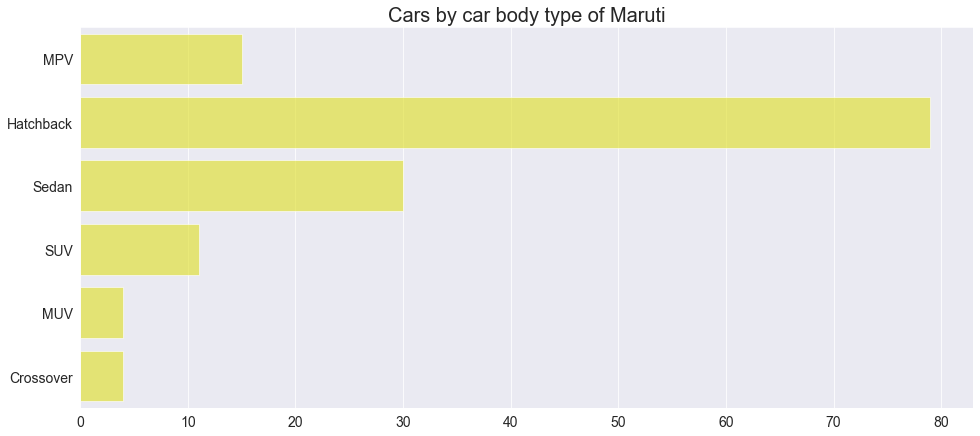

In [10]:
plt.figure(figsize=(16,7))
sns.countplot(data=df1, y='body_type',alpha=.6,color='yellow')
plt.title('Cars by car body type of Maruti',fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('')
plt.ylabel('');

> #### SUV's Sedans and hatchbacks seems to be the dominating car types but in case of Maruti Suzuki Hatchback is the dominating car. 

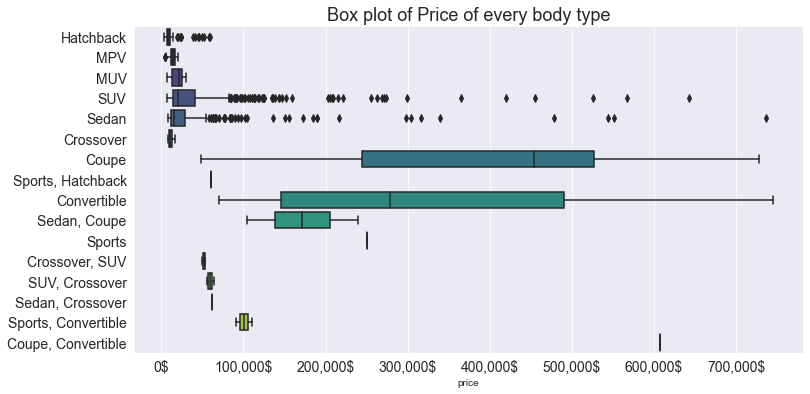

In [11]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df, x='price', y='body_type', palette='viridis')
plt.title('Box plot of Price of every body type',fontsize=18)
plt.ylabel('')
plt.yticks(fontsize=14)
plt.xticks([i for i in range(0,800000,100000)],[f'{i:,}$' for i in range(0,800000,100000)],fontsize=14);

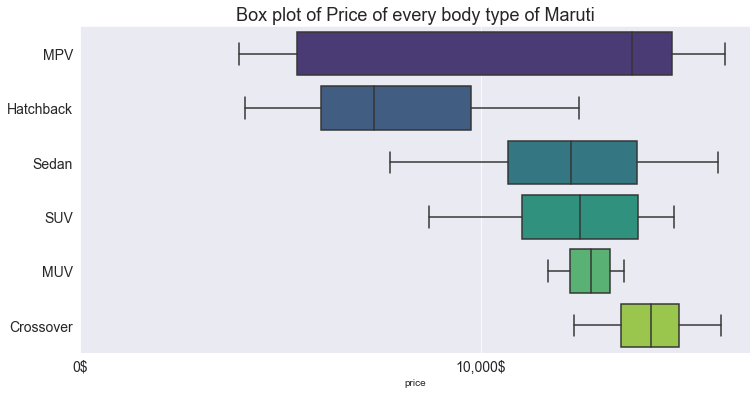

In [12]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df1, x='price', y='body_type', palette='viridis')
plt.title('Box plot of Price of every body type of Maruti',fontsize=18)
plt.ylabel('')
plt.yticks(fontsize=14)
plt.xticks([i for i in range(0,20000,10000)],[f'{i:,}$' for i in range(0,20000,10000)],fontsize=14);

> #### It's Clear that Car body type strongly affect the price. In case of Maruti, average price of Crossover is highest whereas variation in MPV is the highest. The average price of Hatchback is the lowest 

### Now we check cars by Fuel type

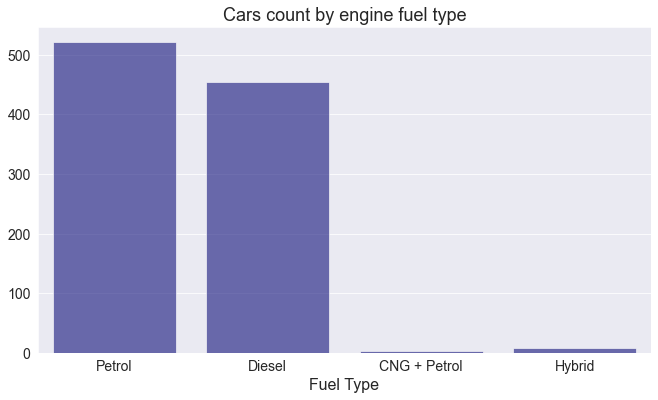

In [13]:
plt.figure(figsize=(11,6))
sns.countplot(data=df, x='fuel_type',alpha=.6, color='darkblue')
plt.title('Cars count by engine fuel type',fontsize=18)
plt.xlabel('Fuel Type', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('');

> #### Most cars seems to be run on Petrol or Diesel

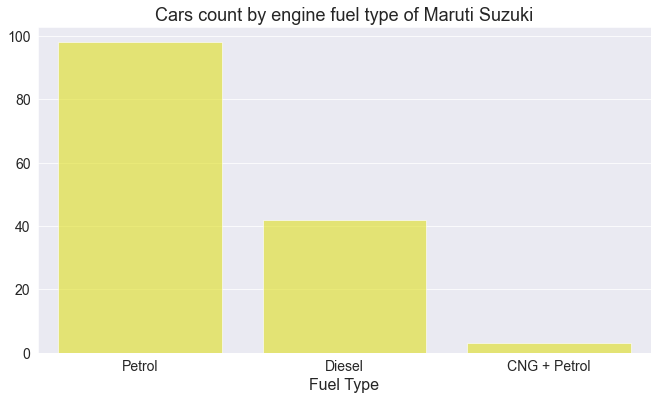

In [14]:
plt.figure(figsize=(11,6))
sns.countplot(data=df1, x='fuel_type',alpha=.6, color='yellow')
plt.title('Cars count by engine fuel type of Maruti Suzuki',fontsize=18)
plt.xlabel('Fuel Type', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('');

>##### Out of various fuel types Maruti Suzuki has not used Hybrid fuel type. Overall, Petrol is the dominant fuel. CNG is used in very less vehicles.

### Now we check car by engine size

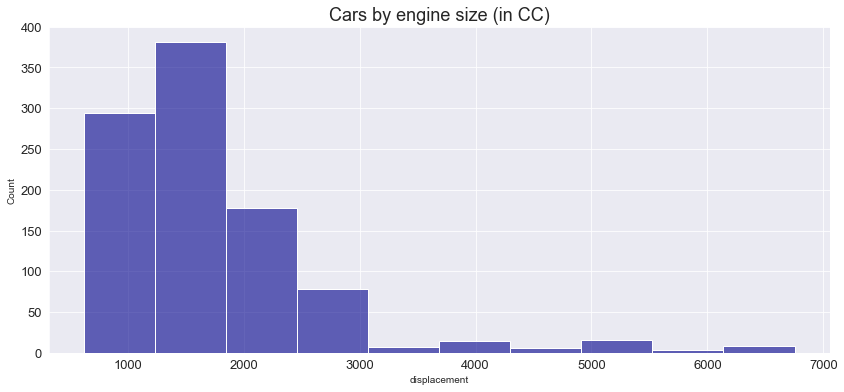

In [15]:
plt.figure(figsize=(14,6))
sns.histplot(data=df, x='displacement',alpha=.6, color='darkblue',bins=10)
plt.title('Cars by engine size (in CC)',fontsize=18)
plt.xticks(fontsize=13);
plt.yticks(fontsize=13);

> #### 

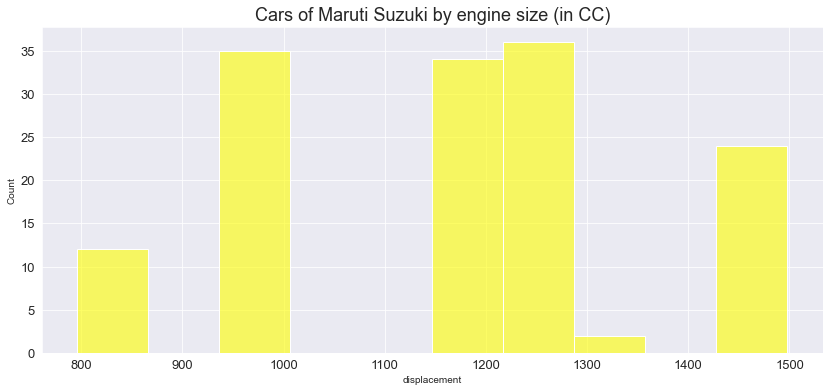

In [16]:
plt.figure(figsize=(14,6))
sns.histplot(data=df1, x='displacement',alpha=.6, color='yellow',bins=10)
plt.title('Cars of Maruti Suzuki by engine size (in CC)',fontsize=18)
plt.xticks(fontsize=13);
plt.yticks(fontsize=13);

> #### Seems like most of cars have engine size in the 1000:2000cc range whereas there are separation of clusters in Maruti Suzuki Engine Size

### Now We check the Horsepower of cars

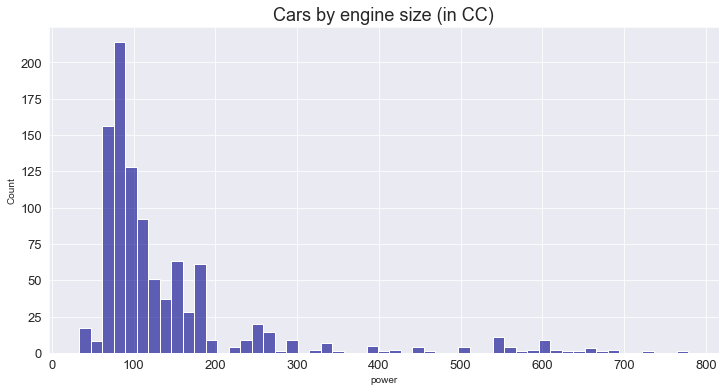

In [17]:
plt.figure(figsize=(12,6))
sns.histplot(data=df, x='power',alpha=.6, color='darkblue')
plt.title('Cars by engine size (in CC)',fontsize=18);
plt.xticks(fontsize=13);
plt.yticks(fontsize=13);

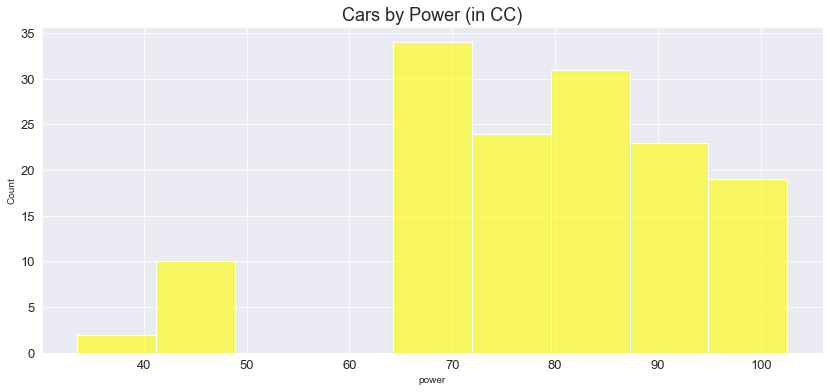

In [18]:
plt.figure(figsize=(14,6))
sns.histplot(data=df1, x='power',alpha=.6, color='yellow')
plt.title('Cars by Power (in CC)',fontsize=18);
plt.xticks(fontsize=13);
plt.yticks(fontsize=13);

### Now we check the relation between horsepower and price considering diffreent body type

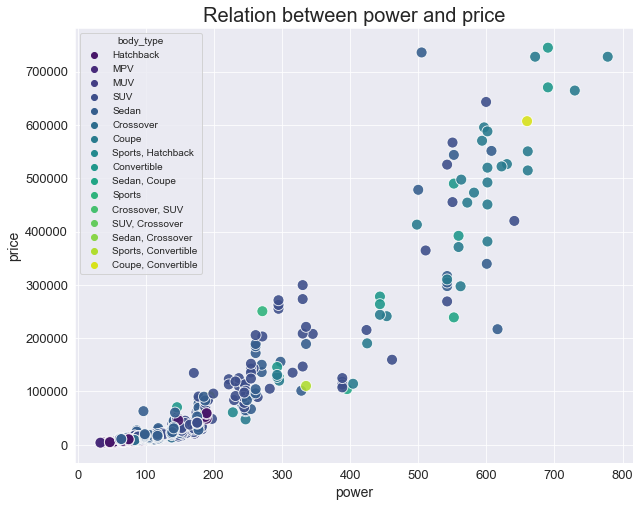

In [19]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df, x='power', y='price',hue='body_type',palette='viridis',alpha=.89, s=120 );
plt.xticks(fontsize=13);
plt.yticks(fontsize=13)
plt.xlabel('power',fontsize=14)
plt.ylabel('price',fontsize=14)
plt.title('Relation between power and price',fontsize=20);

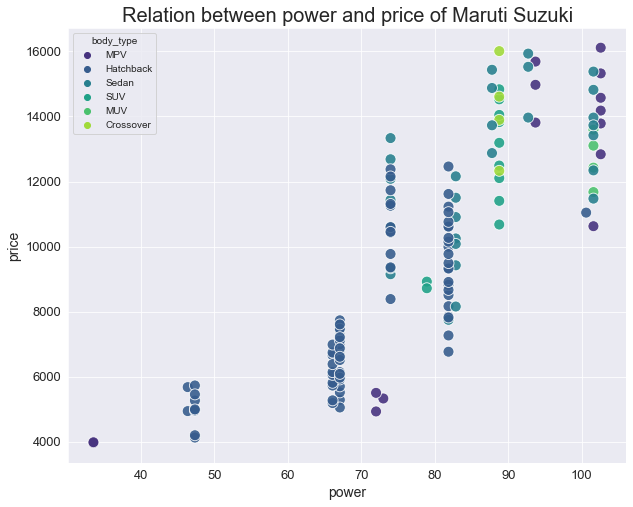

In [20]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df1, x='power', y='price',hue='body_type',palette='viridis',alpha=.89, s=120 );
plt.xticks(fontsize=13);
plt.yticks(fontsize=13)
plt.xlabel('power',fontsize=14)
plt.ylabel('price',fontsize=14)
plt.title('Relation between power and price of Maruti Suzuki',fontsize=20);

> #### Horsepower of car seems to be highly related to car price but car body type seems a little bit blurry but hatchbacls seems to be the body type with the least horsepower and price but hatchbacks seems to be the body type with the least horsepower and price whereas in case of Maruti Suzuki it is MPV.

### We can also look into the relation between Mileage and price

<Figure size 720x576 with 0 Axes>

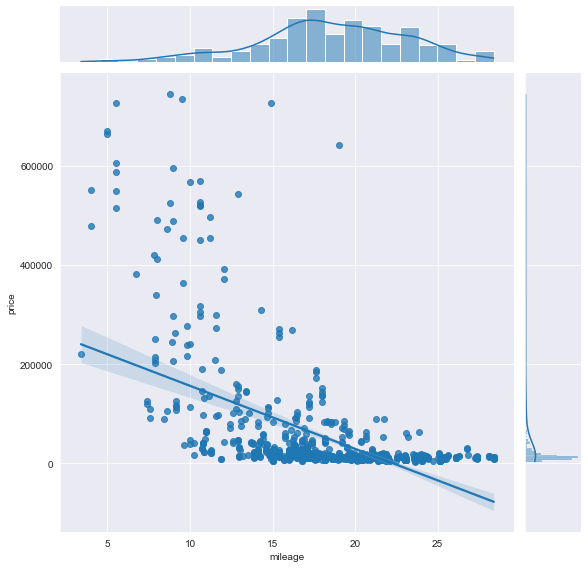

In [21]:
plt.figure(figsize=(10,8))
ax= plt.axis
sns.jointplot(data=df, x='mileage', y='price',kind= 'reg',ax=ax, palette='viridis',height=8,  ratio=7)

<Figure size 720x720 with 0 Axes>

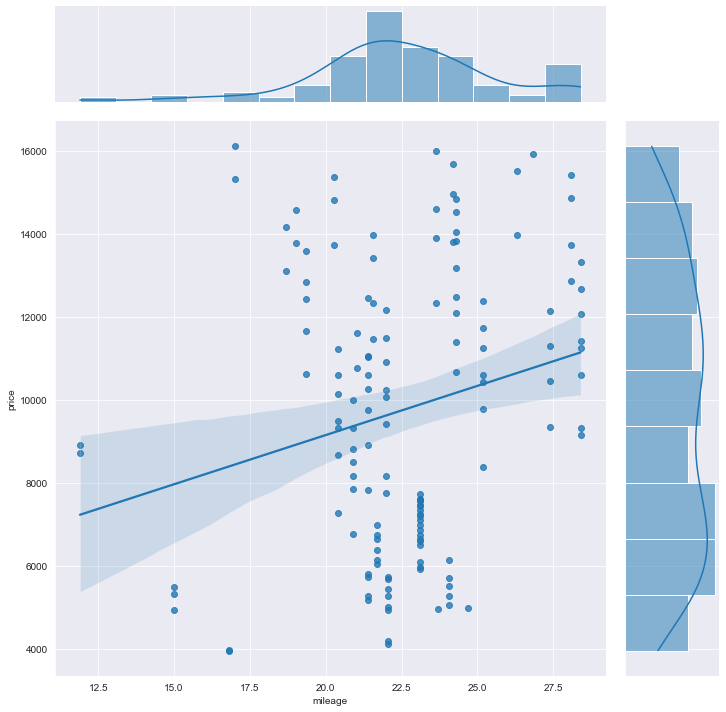

In [22]:
# Maruti
plt.figure(figsize=(10,10))
ax1 = plt.axis
sns.jointplot(data=df1, x='mileage', y='price',kind= 'reg',ax=ax1, palette='viridis',height=10,  ratio=5)

> #### It is interesting to notice that expensive cars tend to have worse mileage. Just opposite to this in case of Maruti Suzuki, expensive cars tend to have better mileage.

### We can also check the overall correlation of variables between each other

### First we make a pearson correlation grid

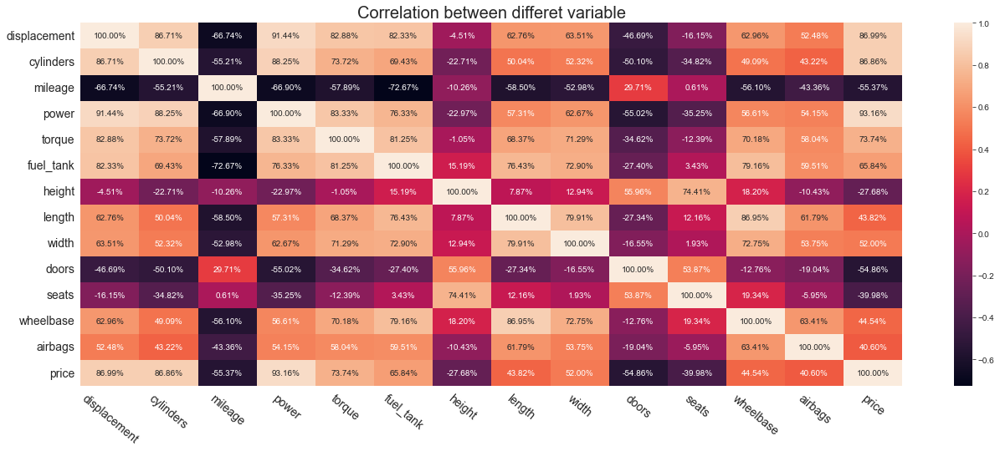

In [23]:
plt.figure(figsize=(22,8))
sns.heatmap(df.corr(), annot=True, fmt='.2%')
plt.title('Correlation between differet variable',fontsize=20)
plt.xticks(fontsize=14, rotation=320)
plt.yticks(fontsize=14);

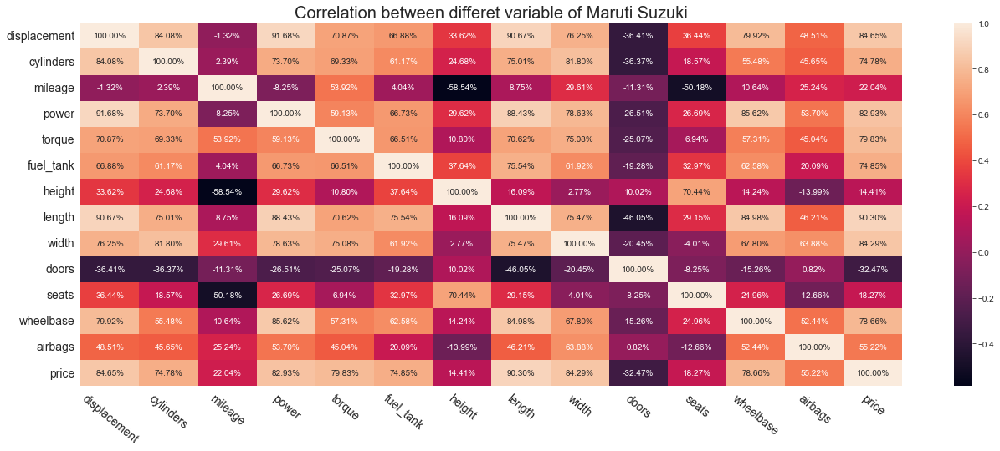

In [24]:
plt.figure(figsize=(22,8))
sns.heatmap(df1.corr(), annot=True, fmt='.2%')
plt.title('Correlation between differet variable of Maruti Suzuki',fontsize=20)
plt.xticks(fontsize=14, rotation=320)
plt.yticks(fontsize=14);

> The difference is minor but clearly visible in the comparison of whole and only Maruti dataframe.

### Now we check an extensive scatter plot grid of more numerical variable to investigate the realtion in more detail

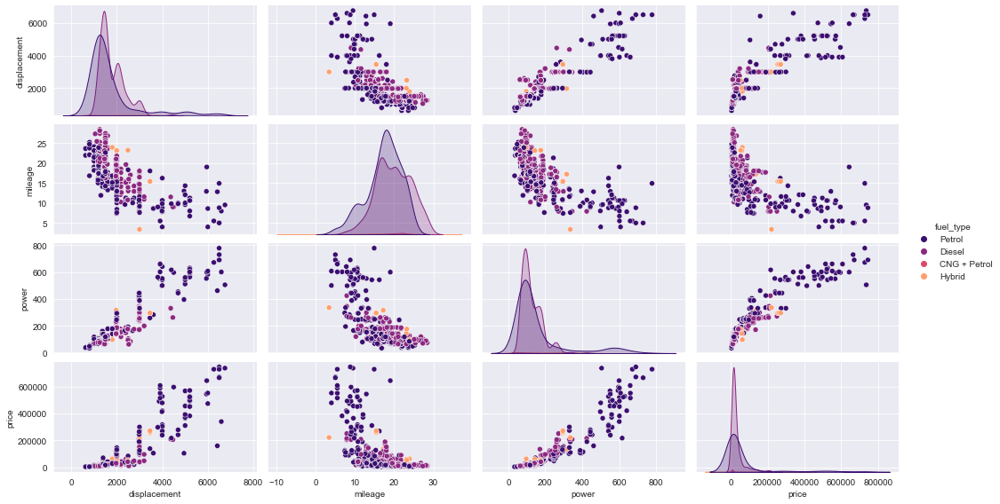

In [25]:
sns.pairplot(df,vars=[ 'displacement', 'mileage', 'power', 'price'], hue= 'fuel_type',
             palette=sns.color_palette('magma',n_colors=4),diag_kind='kde',height=2, aspect=1.8);

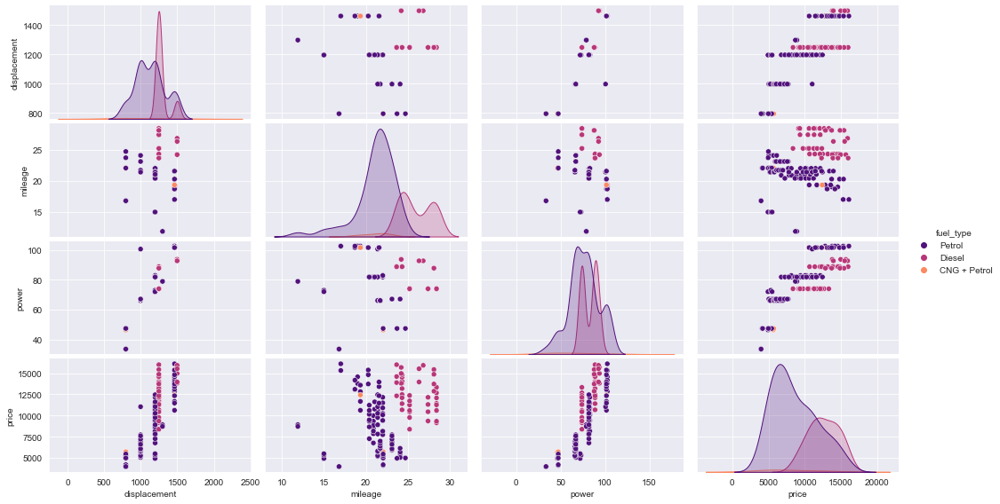

In [26]:
sns.pairplot(df1,vars=[ 'displacement', 'mileage', 'power', 'price'], hue= 'fuel_type',
             palette=sns.color_palette('magma',n_colors=3),diag_kind='kde',height=2, aspect=1.8);

> #### Seems there are a lot of multicollinearity between variables in whole dataset but some clustering seems possible in Maruti cars. 

### Now lets make a 3D scatter plot to check for obvious clusters with main features as price horsepower and mileage

### Using more interactive plot to show the previous plot and also adding the car manufacturer

In [27]:
fig = px.scatter_3d(df, x='power', z='price', y='mileage',color='make',width=800,height=750)
fig.update_layout(showlegend=True)
fig.show();

In [28]:
fig = px.scatter_3d(df, x='power', z='price', y='mileage',color='model',width=800,height=750)
fig.update_layout(showlegend=True)
fig.show();

> #### As shown in previous figures clustring the market needs a lot of effort as the separation of clusters is not that obvious

#### It's now clear that we have to look to many dimensions in order to cluster the market, as the more features we explore the harder it's to cluster the market.This means that two car can have very similar price and milage but one is a van with lots of space and the other is just a four doors sedan, these two cars are precieved as two different categories in the automotive industry so space "length width and height of the car" can also be a vital factor.


<center><img src='https://www.cnet.com/a/img/qtmmL-iMd08jk2MYEVNPkfs7M8U=/2019/02/03/9cd75864-225d-406e-baa0-4852091faf61/2019-dodge-grand-caravan-35th-anniversary-1.jpg' width='480' height="480" ></center>
dodge-grand-caravan which considered to be a soccer mom van


<center><img src='https://upload.wikimedia.org/wikipedia/commons/a/ac/2018_Toyota_Camry_%28ASV70R%29_Ascent_sedan_%282018-08-27%29_01.jpg' width='480' height="480" ></center>
toyota camry which is more of an upper class four door sedan

#### So, a three dimensional representation won't tell everythings, so thats why we will try to consider clustering to use the very different features associated with each car

### We will drop the cars over 30k as they totally not a match for the Maruti Suzuki and try to find some other insights about the data.

In [29]:
df = df[df.price < 30000]

In [30]:
features = [ i for i in df.columns if df[i].dtype != 'object']
print(features)

['displacement', 'cylinders', 'mileage', 'power', 'torque', 'fuel_tank', 'height', 'length', 'width', 'doors', 'seats', 'wheelbase', 'airbags', 'price']


In [31]:
units = ['cc','count','kmpl','rpm','rpm','litres','mm','mm','mm','count','count','mm','count','dollers']
feature_units = dict(zip(features,units))
feature_units

{'displacement': 'cc',
 'cylinders': 'count',
 'mileage': 'kmpl',
 'power': 'rpm',
 'torque': 'rpm',
 'fuel_tank': 'litres',
 'height': 'mm',
 'length': 'mm',
 'width': 'mm',
 'doors': 'count',
 'seats': 'count',
 'wheelbase': 'mm',
 'airbags': 'count',
 'price': 'dollers'}

In [32]:
data = df[features]
data.head()

,displacement,cylinders,mileage,power,torque,fuel_tank,height,length,width,doors,seats,wheelbase,airbags,price
0,624,2,23.6,37.48,51,24.0,1652.0,3164.0,1750.0,5,4,2230.0,0,4097
1,624,2,23.6,37.48,51,24.0,1652.0,3164.0,1750.0,5,4,2230.0,0,3310
3,624,2,21.9,37.48,51,24.0,1652.0,3164.0,1750.0,5,4,2230.0,0,4686
4,624,2,23.6,37.48,51,24.0,1652.0,3164.0,1750.0,5,4,2230.0,0,3811
5,624,2,21.9,37.48,51,24.0,1652.0,3164.0,1750.0,5,4,2230.0,0,4407


In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 758 entries, 0 to 1274
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   displacement  758 non-null    int32  
 1   cylinders     758 non-null    int32  
 2   mileage       758 non-null    float64
 3   power         758 non-null    float64
 4   torque        758 non-null    int32  
 5   fuel_tank     758 non-null    float64
 6   height        758 non-null    float64
 7   length        758 non-null    float64
 8   width         758 non-null    float64
 9   doors         758 non-null    int32  
 10  seats         758 non-null    int32  
 11  wheelbase     758 non-null    float64
 12  airbags       758 non-null    int32  
 13  price         758 non-null    int32  
dtypes: float64(7), int32(7)
memory usage: 68.1 KB


In [34]:
data.describe()

,displacement,cylinders,mileage,power,torque,fuel_tank,height,length,width,doors,seats,wheelbase,airbags,price
count,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.00000
mean,1420.560686,3.787599,19.936794,96.035871,179.849604,44.898417,1595.656992,4106.292876,1728.821900,4.705805,5.395778,2543.312665,2.162269,13224.21372
std,375.672745,0.540076,3.623540,27.318426,93.429937,9.549370,122.941936,340.924032,86.865913,0.473044,0.900071,126.753627,1.564568,5634.49492
min,624.000000,2.000000,10.220000,33.530000,10.000000,24.000000,1433.000000,3164.000000,1410.000000,3.000000,4.000000,1840.000000,0.000000,3310.00000
25%,1197.000000,4.000000,17.100000,75.950000,114.000000,37.000000,1507.000000,3895.000000,1695.000000,4.000000,5.000000,2450.000000,2.000000,9283.25000
50%,1366.000000,4.000000,20.000000,88.770000,170.000000,44.000000,1555.000000,3995.000000,1734.000000,5.000000,5.000000,2520.000000,2.000000,12084.50000
75%,1498.000000,4.000000,23.000000,108.500000,220.000000,50.000000,1651.750000,4413.000000,1785.000000,5.000000,5.000000,2650.000000,2.000000,15905.75000
max,2755.000000,6.000000,28.400000,182.470000,1712.000000,80.000000,2055.000000,5118.000000,1965.000000,5.000000,9.000000,3040.000000,8.000000,29862.00000


The Statistical Analysis gives important information about central tendency of variuos features viz. displacement, mileage, power etc.

### Now we choose a collection of features and try to find out number of clusters of cars by Elbow method

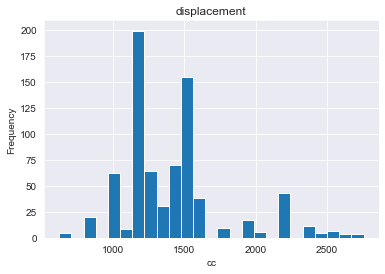

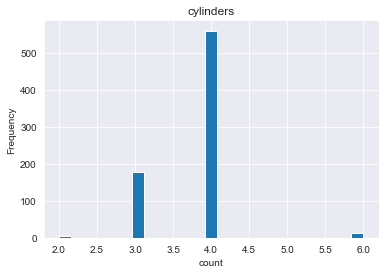

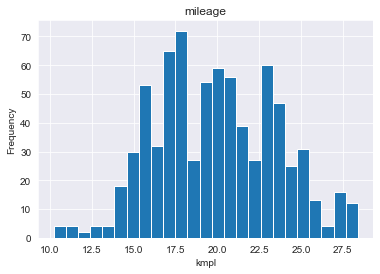

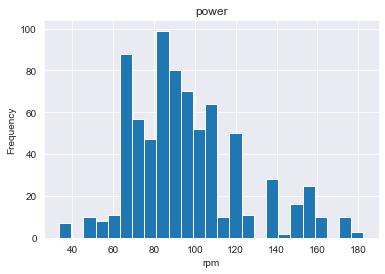

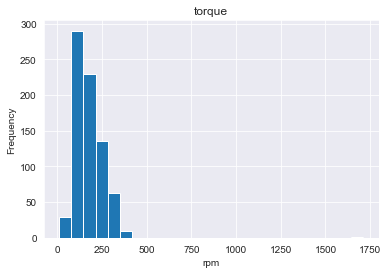

...

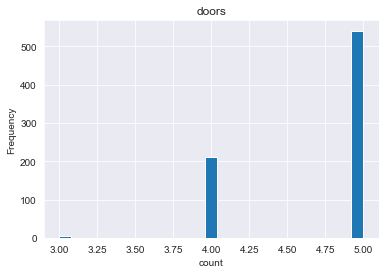

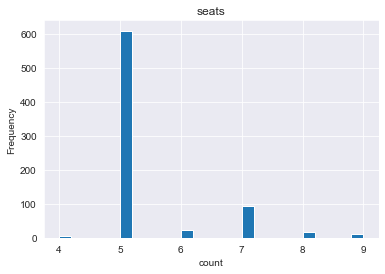

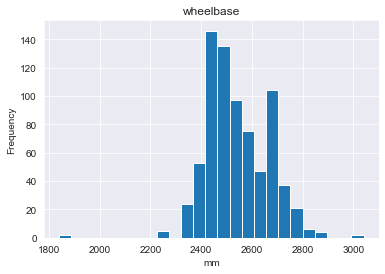

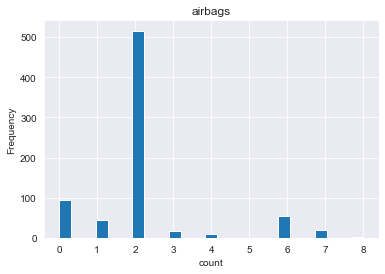

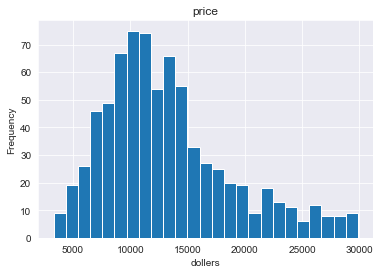

In [35]:
for item in features:
    data[item].plot(kind='hist', bins = 25)
    plt.title(item)
    plt.xlabel(feature_units[item])
    plt.show()

From histograms, we observe that the data points are clearly segregated into different groups, with differing
number of segregations for each feature.

In [36]:
correlation = data.corr()
print(correlation)

              displacement  cylinders   mileage     power    torque  \
displacement      1.000000   0.405323 -0.518944  0.706050  0.582699   
cylinders         0.405323   1.000000 -0.230712  0.498879  0.344780   
mileage          -0.518944  -0.230712  1.000000 -0.524036 -0.196823   
power             0.706050   0.498879 -0.524036  1.000000  0.621177   
torque            0.582699   0.344780 -0.196823  0.621177  1.000000   
fuel_tank         0.778590   0.457372 -0.582863  0.683049  0.588054   
height            0.613015   0.042969 -0.458199  0.314194  0.400512   
length            0.732918   0.526789 -0.477811  0.767666  0.544134   
width             0.648290   0.361669 -0.383152  0.718552  0.602957   
doors            -0.056123  -0.188034 -0.053542 -0.040422  0.057073   
seats             0.572794   0.034568 -0.390864  0.312567  0.349851   
wheelbase         0.704227   0.414216 -0.450547  0.664841  0.524047   
airbags           0.282043   0.192487 -0.167753  0.506431  0.248341   
price 

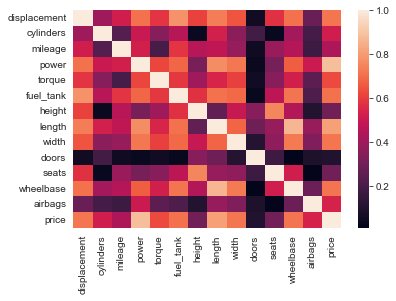

In [37]:
sns.heatmap(np.abs(correlation), xticklabels = correlation.columns, yticklabels = correlation)
plt.show()

From correlation table and correlation heatmap, we see that power,fuel_tank,length and wheelbase are
highly correlated with price. Mileage and No. of doors are negetively correlated.

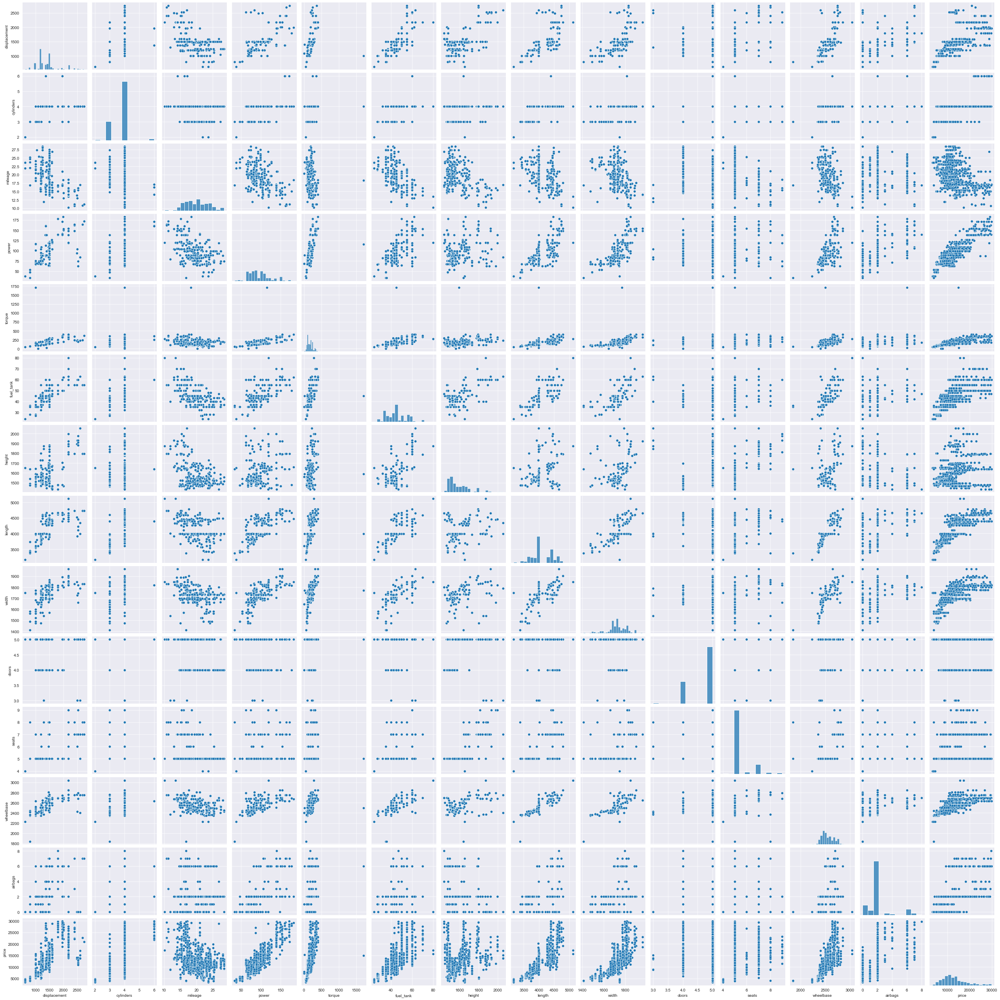

In [38]:
sns.pairplot(data)
plt.show()

#### Observation about scatter
We see that few clusters are spherically distributed and few are elliptically distributed
Also there exist different number of clusters ( 2,3,4,5 ) for different pair combination of features
Few clusters are compact while others are not
In most of the scatter plots (subplots) above, we see that there are 3 candidate clusters (based on
compactness and isolation)

#### Scaling : Important step in every Machine Learning problem-
To avoid giving undue advantage to some features which are expressed in some particular units,
whose magnitude might be higer than some other feature variable (due to choice of units), scaling all
features, so that they are numerically of same order of magnitude, is essential.
We will use standard scaling (xi-u)/sigma.

In [39]:
from sklearn.preprocessing import StandardScaler
import copy as cp
data2 = data.copy()
data2 = StandardScaler().fit_transform(data2.values)
data2 = pd.DataFrame(data2,columns = features)

## K-Means Clsutering: 
A technique to partition N observations into K clusters (K≤N) in which each observation belongs to
cluster with nearest mean
One of the simplest unsupervised algorithms
Given N observations (x1,x2,...,xN) , K-means clustering will partition n observations into K (K≤N) sets
S={s1,...,sk} so as to minimize the within cluster sum of squares (WCSS)

### Determining number of clusters(K):
Let us try clustering the data with K-Means for different values of K
Elbow method – looks at percentage of variance explained as a function of number of clusters
The point where marginal decrease plateaus is an indicator of the optimal number of clusters
We will summarize K-Means for different k in an elbow plot below

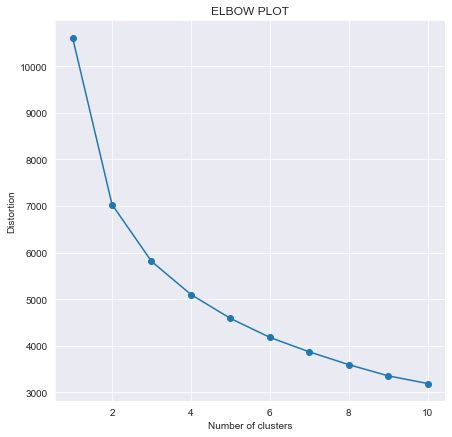

In [40]:
from sklearn import cluster

distortions = [] # Empty list to store wss
for i in range(1, 11):
    km = cluster.KMeans(n_clusters=i,
    init='k-means++',
    n_init = 10,
    max_iter = 300,
    random_state = 0)
    km.fit(data2.values)
    distortions.append(km.inertia_)
#Plotting the K-means Elbow plot
plt.figure(figsize = (7,7))
plt.plot(range(1,11), distortions, marker='o')
plt.title('ELBOW PLOT')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

#### Here Kmeans++ gives us optimal number of clusters centroid to start with and the most appropriate value we got by Elbow comes out 3 because after this there is marginal decreased in distortion.

In [41]:
k = 3
km3 = cluster.KMeans(n_clusters=k,
init='k-means++',
n_init = 10,
max_iter = 300,
random_state = 100)
km3.fit(data2.values)

KMeans(n_clusters=3, random_state=100)

In [42]:
labels = km3.labels_
#Ccenters = km3.cluster_centers_
data2['labels'] = labels + 1
data2['labels'] = data2['labels'].astype('str')
print(data2['labels'].value_counts())

2    386
1    257
3    115
Name: labels, dtype: int64


### Thus we have clustered the data into three groups above, which is visible in the following pairplot.

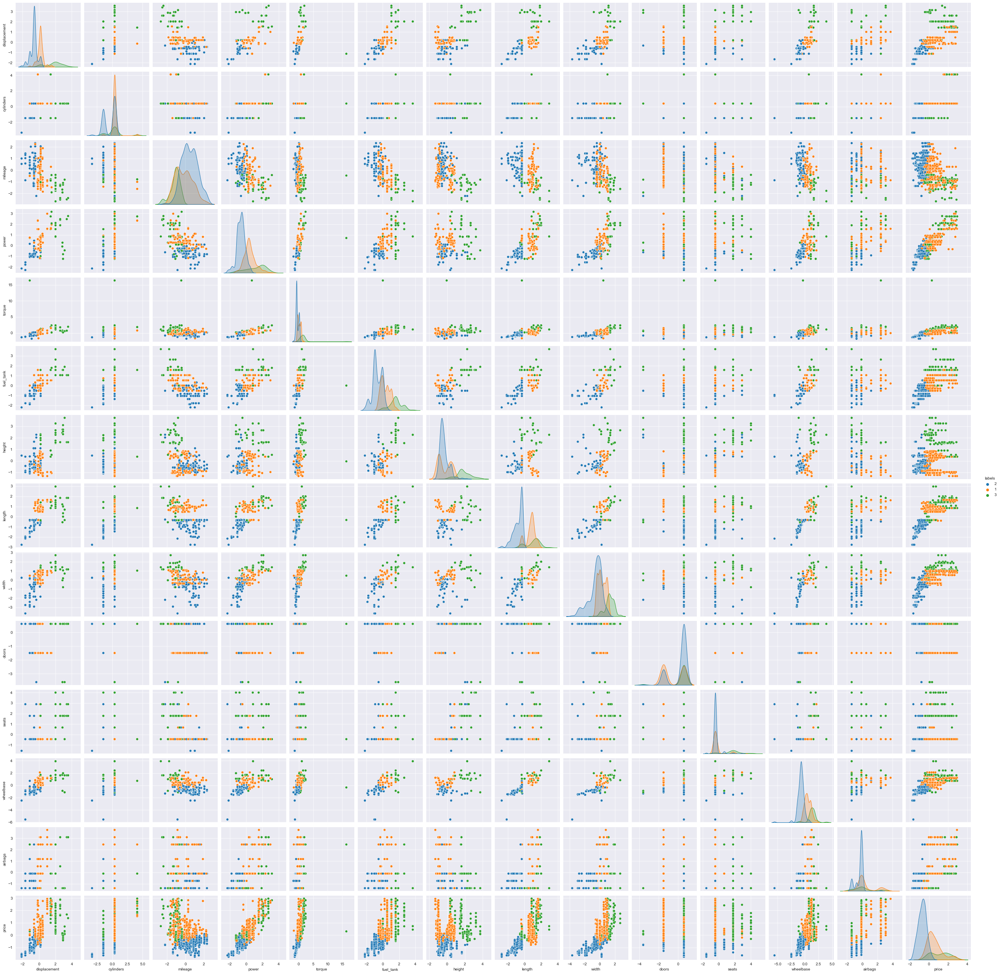

In [43]:
sns.pairplot(data2, x_vars = features, y_vars = features, hue='labels', diag_kind='kde')
plt.show()

We see from pair plot that, for every pair of features, the points have been well clustered into different
groups. Though isolation and compactness are not observed together in all possible pairs of features.

### Fitting K-means clustering model with 3 clusters and adding a cluster column to the dataset

In [44]:
km1 = KMeans(n_clusters=3, n_init=10, max_iter=400, random_state=0)
clusters = km1.fit_predict(df[features])
df['cluster'] = clusters
df.cluster = (df.cluster + 1).astype('object')
df.sample(5)

,make,model,car,variant,body_type,fuel_type,fuel_system,type,drivetrain,displacement,cylinders,mileage,power,torque,fuel_tank,height,length,width,doors,seats,wheelbase,airbags,price,cluster
38,Datsun,Go,Datsun Go,A (O),Hatchback,Petrol,Injection,Manual,FWD (Front Wheel Drive),1198,3,20.1,67.07,104,35.0,1507.0,3788.0,1636.0,5,5,2450.0,2,6999,1
739,Toyota,Corolla Altis,Toyota Corolla Altis,Vl At Petrol,Sedan,Petrol,Injection,Automatic,FWD (Front Wheel Drive),1798,4,16.7,138.08,173,55.0,1475.0,4620.0,1775.0,4,5,2700.0,7,28266,2
470,Honda,Amaze,Honda Amaze,E Mt Petrol,Sedan,Petrol,Injection,Manual,FWD (Front Wheel Drive),1199,4,19.5,88.77,110,35.0,1498.0,3995.0,1695.0,4,5,2470.0,2,8302,1
561,Ford,Ecosport,Ford Ecosport,1.5L Ti-Vct Thunder Edition,SUV,Petrol,Injection,Manual,FWD (Front Wheel Drive),1497,4,23.0,121.32,150,52.0,1647.0,3998.0,1765.0,5,5,2519.0,6,13998,3
528,Fiat,Linea,Fiat Linea,Active Multijet,Sedan,Diesel,Injection,Manual,FWD (Front Wheel Drive),1248,4,20.4,91.73,209,45.0,1494.0,4596.0,1730.0,4,5,2603.0,0,12070,3


### Now we check some scatter plots but with adding cluster.

### Price vs Power

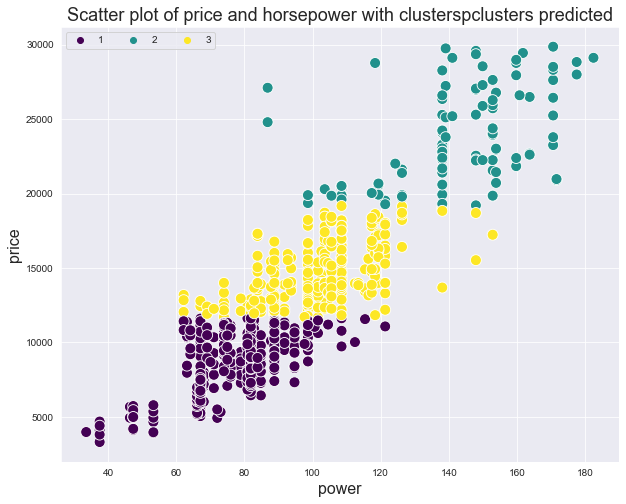

In [45]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df, y='price', x='power',s=120,hue='cluster',palette='viridis')
plt.legend(ncol=4)
plt.title('Scatter plot of price and horsepower with clusterspclusters predicted', fontsize=18)
plt.xlabel('power',fontsize=16)
plt.ylabel('price',fontsize=16);

> #### We can see the the clusters are strongly affected by the price with clear speration between clusters but it's kind of blurry when it comes to power

### Power vs Mileage

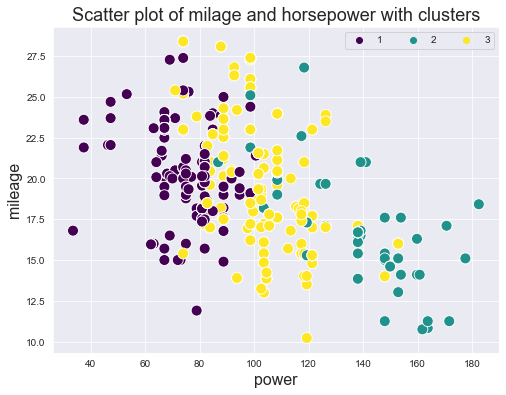

In [46]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='power', y='mileage',s=120,hue='cluster',palette='viridis')
plt.legend(ncol=4)
plt.title('Scatter plot of milage and horsepower with clusters', fontsize=18);
plt.xlabel('power',fontsize=16)
plt.ylabel('mileage',fontsize=16);

> #### But yet we can see that clusters speration in power is stronger than mileage which almost have no separation of clusters

### Engine size vs Fuel tank

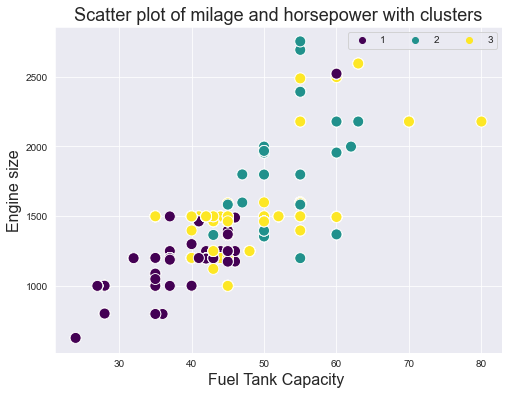

In [47]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='fuel_tank', y='displacement',s=120,hue='cluster',palette='viridis')
plt.legend(ncol=4)
plt.title('Scatter plot of milage and horsepower with clusters', fontsize=18);
plt.xlabel('Fuel Tank Capacity ',fontsize=16)
plt.ylabel('Engine size',fontsize=16);

### Now we make an interactive 3D scatter plot of price power, and mileage using also clusters

In [48]:
fig = px.scatter_3d(df, x='power', z='price', y='mileage',color='cluster',
                    height=700, width=800,color_discrete_sequence=sns.color_palette('colorblind',n_colors=8,desat=1).as_hex(),
                   title='price power, and mileage')
fig.show()

### Now we check the average prices of each cluster

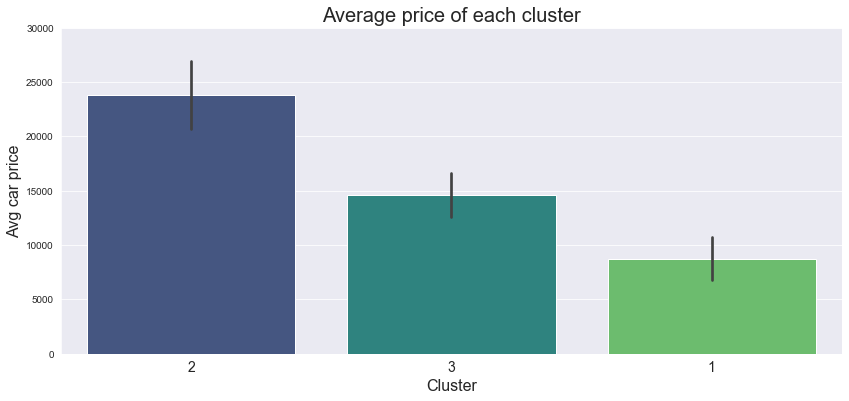

In [49]:
plt.figure(figsize=(14,6))
sns.barplot(data=df, x= 'cluster', ci= 'sd', y= 'price', palette='viridis',order=df.groupby('cluster')['price'].mean().sort_values(ascending=False).index);
plt.yticks([i for i in range(0,35000,5000)])
plt.title('Average price of each cluster',fontsize=20)
plt.xlabel('Cluster',fontsize=16)
plt.ylabel('Avg car price', fontsize=16)
plt.xticks(fontsize=14);

> #### As shown in the scatter plits earlier there is a clear seperation of clusters when it comes to prices

### Now we check how many cars exists in each cluster

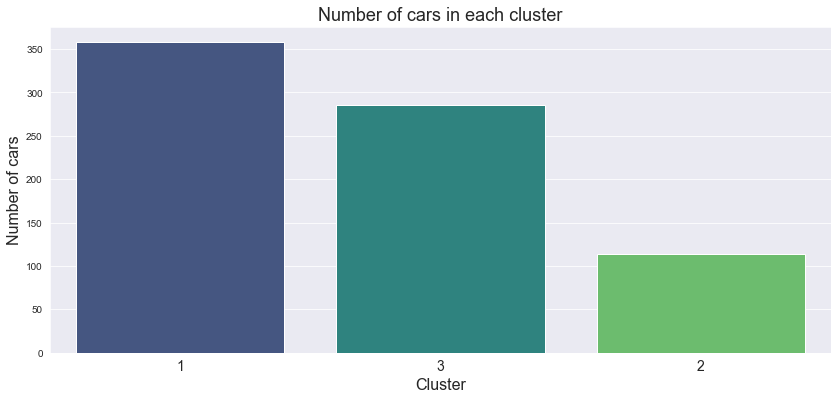

In [50]:
plt.figure(figsize=(14,6))
sns.countplot(data=df, x= 'cluster', palette='viridis',order=df.cluster.value_counts().index);
# plt.yticks([i for i in range(0,65000,5000)])
plt.title('Number of cars in each cluster',fontsize=18)
plt.xlabel('Cluster',fontsize=16)
plt.ylabel('Number of cars', fontsize=16)
plt.xticks(fontsize=14);

> #### We can generally say that even if clusters generated are not determinant yet we can see that they still can be useful 

# Finding the potential strategic group

### We, now find the cluster of the Swift (and its variants)

In [51]:
df[df.model == 'Swift']

,make,model,car,variant,body_type,fuel_type,fuel_system,type,drivetrain,displacement,cylinders,mileage,power,torque,fuel_tank,height,length,width,doors,seats,wheelbase,airbags,price,cluster
416,Maruti Suzuki,Swift,Maruti Suzuki Swift,Lxi,Hatchback,Petrol,Injection,Manual,FWD (Front Wheel Drive),1197,4,20.4,81.86,113,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,7266,1
417,Maruti Suzuki,Swift,Maruti Suzuki Swift,Vxi,Hatchback,Petrol,Injection,Manual,FWD (Front Wheel Drive),1197,4,20.4,81.86,113,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,8666,1
418,Maruti Suzuki,Swift,Maruti Suzuki Swift,Vxi Amt,Hatchback,Petrol,Injection,Automatic,FWD (Front Wheel Drive),1197,4,20.4,81.86,113,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,9324,1
419,Maruti Suzuki,Swift,Maruti Suzuki Swift,Zxi,Hatchback,Petrol,Injection,Manual,FWD (Front Wheel Drive),1197,4,20.4,81.86,113,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,9492,1
420,Maruti Suzuki,Swift,Maruti Suzuki Swift,Zxi Amt,Hatchback,Petrol,Injection,Automatic,FWD (Front Wheel Drive),1197,4,20.4,81.86,113,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,10150,1
421,Maruti Suzuki,Swift,Maruti Suzuki Swift,Zxi Plus,Hatchback,Petrol,Injection,Manual,FWD (Front Wheel Drive),1197,4,20.4,81.86,113,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,10612,1
422,Maruti Suzuki,Swift,Maruti Suzuki Swift,Ldi,Hatchback,Diesel,Injection,Manual,FWD (Front Wheel Drive),1248,4,25.2,73.97,190,37.0,1530.0,3840.0,1735.0,5,5,2430.0,2,8386,1
423,Maruti Suzuki,Swift,Maruti Suzuki Swift,Vdi,Hatchback,Diesel,Injection,Manual,FWD (Front Wheel Drive),1248,4,25.2,73.97,190,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,9772,1
424,Maruti Suzuki,Swift,Maruti Suzuki Swift,Vdi Amt,Hatchback,Diesel,Injection,Automatic,FWD (Front Wheel Drive),1248,4,25.2,73.97,190,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,10430,1
425,Maruti Suzuki,Swift,Maruti Suzuki Swift,Zdi,Hatchback,Diesel,Injection,Manual,FWD (Front Wheel Drive),1248,4,25.2,73.97,190,37.0,1530.0,3840.0,1735.0,5,5,2450.0,2,10598,1


### We found that the cluster of the Swift is cluster 1 and cluster 2 we can now search these clusters and check what is intersing about it:

In [52]:
df_c = df[df.cluster.isin([1,2,3])]
p_dic = {'Mahindra':'#46327e', 'Tata':'#46327e', 'Toyota':'#46327e', 'Nissan': '#46327e','Volkswagen': '#46327e', 'Fiat': '#46327e',
         'Jeep':'#46327e', 'Honda':'#46327e', 'Kia':'#46327e', 'Ford':'#46327e','Renault':'#46327e', 'Premier':'#46327e',
         'Hyundai':'#46327e','Skoda':'#46327e', 'Datsun':'#46327e', 'Maruti Suzuki':'orange','Force':'#46327e','Maruti Suzuki R':'#46327e'}
c_dic = {'Tata Nexon': '#46327e','Mahindra Kuv100 Nxt':'#46327e','Mahindra Xuv500':'#46327e','Honda Amaze':'#46327e',
         'Hyundai Creta': '#46327e','Toyota Innova Crysta':'#46327e','Skoda Rapid':'#46327e','Jeep Compass': '#46327e',
         'Maruti Suzuki Dzire':'#46327e','Toyota Yaris':'#46327e','Toyota Etios Liva':'#46327e','Maruti Suzuki Ciaz':'#46327e',
         'Maruti Suzuki Baleno':'#46327e','Hyundai Elite I20':'#46327e','Volkswagen Vento':'#46327e','Ford Ecosport':'#46327e',
         'Renault Kwid':'#46327e','Ford Aspire':'#46327e','Tata Zest':'#46327e','Hyundai Verna':'#46327e','Toyota Platinum Etios':'#46327e',
         'Maruti Suzuki Celerio':'#46327e','Maruti Suzuki S-Presso':'#46327e','Honda City':'#46327e','Maruti Suzuki Ertiga':'#46327e',
         'Hyundai Grand I10 Nios':'#46327e','Maruti Suzuki Vitara Brezza':'#46327e','Mahindra Scorpio':'#46327e','Hyundai Venue':'#46327e',
         'Datsun Go':'#46327e','Renault Duster':'#46327e','Honda Jazz':'#46327e','Maruti Suzuki Alto':'#46327e','Ford Freestyle':'#46327e',
         'Volkswagen Polo':'#46327e','Nissan Kicks':'#46327e','Tata Bolt':'#46327e','Mahindra Marazzo':'#46327e','Maruti Suzuki Celerio X':'#46327e',
         'Tata Tiago':'#46327e','Skoda Octavia':'#46327e','Honda Brv':'#46327e','Maruti Suzuki Ignis':'#46327e','Mahindra Tuv300':'#46327e',
         'Nissan Sunny':'#46327e','Tata Harrier':'#46327e','Datsun Redi-Go':'#46327e','Nissan Terrano':'#46327e','Toyota Corolla Altis':'#46327e',
         'Ford Figo':'#46327e','Honda Wr-V':'#46327e','Renault Lodgy':'#46327e','Tata Tigor':'#46327e','Hyundai Santro':'#46327e',
         'Toyota Etios Cross':'#46327e','Premier Rio':'#46327e','Mahindra Bolero':'#46327e','Hyundai Grand I10':'#46327e','Toyota Glanza':'#46327e',
         'Mahindra Xylo':'#46327e','Kia Seltos':'#46327e','Hyundai Xcent':'#46327e','Tata Nano Genx':'#46327e','Fiat Linea':'#46327e',
         'Mahindra Bolero Power Plus':'#46327e','Mahindra Nuvosport':'#46327e','Maruti Suzuki Alto K10':'#46327e','Renault Triber':'#46327e',
         'Nissan Micra':'#46327e','Hyundai Elantra':'#46327e','Tata Safari Storme':'#46327e','Fiat Punto Evo':'#46327e','Renault Captur':'#46327e',
         'Hyundai I20 Active':'#46327e','Maruti Suzuki S-Cross':'#46327e','Honda Civic':'#46327e','Fiat Urban Cross':'#46327e',
         'Tata Hexa':'#46327e','Force Gurkha':'#46327e','Maruti Suzuki Xl6':'#46327e','Skoda Monte Carlo':'#46327e',
         'Hyundai Xcent Prime':'#46327e','Nissan Micra Active':'#46327e','Mahindra Verito Vibe':'#46327e','Maruti Suzuki Eeco':'#46327e',
         'Mahindra Thar':'#46327e','Tata Tiago Nrg':'#46327e','Mahindra Verito':'#46327e','Fiat Avventura':'#46327e','Fiat Linea Classic':'#46327e',
         'Volkswagen Ameo':'#46327e','Mahindra Tuv300 Plus':'#46327e','Maruti Suzuki R Wagon':'#46327e','Tata Altroz':'#46327e','Maruti Suzuki Gypsy':'#46327e',
         'Maruti Suzuki Alto 800 Tour':'#46327e','Hyundai Tucson':'#46327e','Maruti Suzuki Omni':'#46327e','Maruti Suzuki Dzire Tour':'#46327e',
         'Fiat Punto Evo Pure':'#46327e','Hyundai Grand I10 Prime':'#46327e','Maruti Suzuki Baleno Rs':'#46327e','Maruti Suzuki Celerio Tour':'#46327e',
         'Mahindra Xuv300':'#46327e','Maruti Suzuki Swift':'orange'}

### First we check a sample of these clusters

In [53]:
df_c.sample(8)

,make,model,car,variant,body_type,fuel_type,fuel_system,type,drivetrain,displacement,cylinders,mileage,power,torque,fuel_tank,height,length,width,doors,seats,wheelbase,airbags,price,cluster
510,Tata,Nexon,Tata Nexon,Xma,SUV,Petrol,Injection,Automatic,FWD (Front Wheel Drive),1198,3,17.60,108.50,170,44.0,1607.0,3994.0,1811.0,5,5,2498.0,2,11620,1
1191,Mahindra,Nuvosport,Mahindra Nuvosport,N6,SUV,Diesel,Injection,Manual,FWD (Front Wheel Drive),1493,3,17.21,98.63,240,60.0,1870.0,3985.0,1850.0,5,7,2760.0,2,12678,3
23,Renault,Kwid,Renault Kwid,Climber (O) Amt 1.0,Hatchback,Petrol,Injection,Automatic,FWD (Front Wheel Drive),999,3,24.04,67.07,91,28.0,1490.0,3731.0,1579.0,5,5,2422.0,2,6890,1
1257,Mahindra,Verito,Mahindra Verito,1.5 D6 Bs-Iv,Sedan,Diesel,Injection,Manual,FWD (Front Wheel Drive),1461,4,21.00,118.36,280,50.0,1540.0,4277.0,1740.0,4,5,2630.0,0,11832,3
61,Tata,Tiago,Tata Tiago,Revotron Xza Plus Dual Tone,Hatchback,Petrol,Injection,AMT,FWD (Front Wheel Drive),1199,3,24.00,84.82,114,35.0,1535.0,3746.0,1647.0,5,5,2400.0,2,9240,1
180,Volkswagen,Ameo,Volkswagen Ameo,Comfortline 1.0L,Sedan,Petrol,Injection,Manual,FWD (Front Wheel Drive),999,3,19.00,74.96,95,45.0,1483.0,3995.0,1682.0,4,5,2470.0,2,9310,1
621,Honda,Brv,Honda Brv,S Petrol,SUV,Petrol,Injection,Manual,FWD (Front Wheel Drive),1497,4,15.40,117.37,145,42.0,1666.0,4453.0,1735.0,5,7,2662.0,2,14740,3
551,Ford,Ecosport,Ford Ecosport,1.5L Ti-Vct Ambiente,SUV,Petrol,Injection,Manual,FWD (Front Wheel Drive),1497,3,17.00,121.32,150,52.0,1647.0,3998.0,1765.0,5,5,2519.0,2,11074,1


### Now we check prices and number of cars in these clusters

Text(0.5, 0, '')

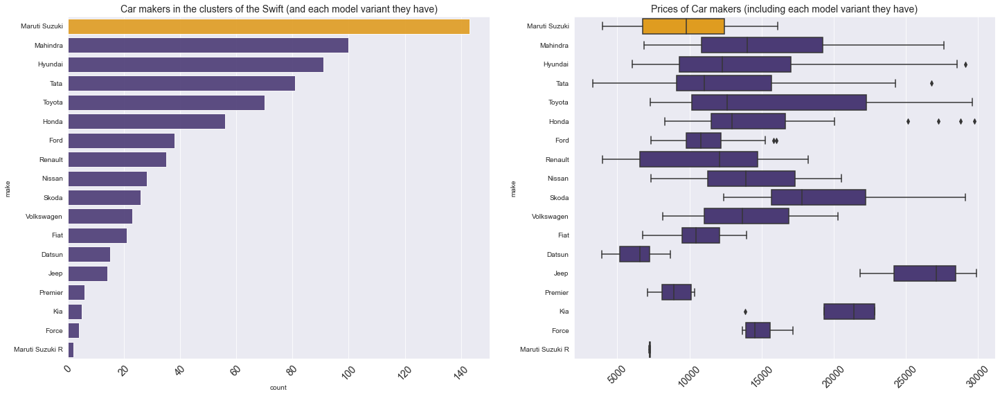

In [54]:
fig = plt.figure(figsize=(24,20))
grid =  gridspec.GridSpec(2, 2, figure= fig, hspace= .2, wspace=.2)
ax11 = fig.add_subplot(grid[0, 0])
ax12 = fig.add_subplot(grid[0, 1])
order = list(df_c.make.value_counts().index)

sns.countplot(data=df_c, y='make', palette=p_dic, alpha= .9,order=order, ax= ax11)
ax11.set_title('Car makers in the clusters of the Swift (and each model variant they have)', fontsize=14)
ax11.xaxis.set_tick_params(labelsize=14,rotation=45)

sns.boxplot(data= df_c, y= 'make', x='price', order=order,palette=p_dic, ax=ax12)
ax12.xaxis.set_tick_params(labelsize=14,rotation=45)
ax12.set_title('Prices of Car makers (including each model variant they have)', fontsize=14)
ax12.set_xlabel('')


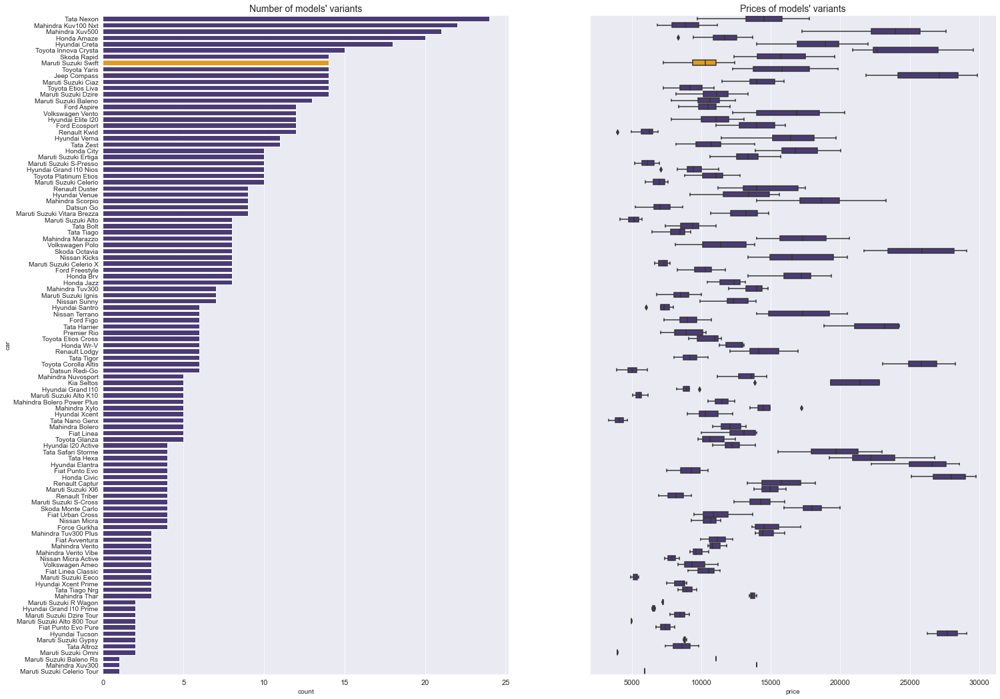

In [55]:
fig = plt.figure(figsize=(24,40))
grid =  gridspec.GridSpec(2, 2, figure= fig, hspace= .2, wspace=.2)
ax21 = fig.add_subplot(grid[1, 0])
ax22 = fig.add_subplot(grid[1, 1])
order = list(df_c.make.value_counts().index)

o2 = list(df_c.car.value_counts(ascending=False).index)
sns.countplot(data=df_c, y='car', palette=c_dic, ax=ax21,order= o2)
ax21.xaxis.set_tick_params(labelsize=11,rotation=0)
ax21.set_title('Number of models\' variants', fontsize=14)

sns.boxplot(data=df_c, y='car', x='price', ax=ax22, order=o2, palette=c_dic )
ax22.xaxis.set_tick_params(labelsize=11,rotation=0)
ax22.set_title('Prices of models\' variants', fontsize=14)
ax22.set_yticklabels([])
ax22.set_ylabel('');

### Here is a more interactive chart that shows cars prices including all variants (with make and min value of each car)

In [56]:
px.box(data_frame=df_c,x='car',y='price',height=500,  width=800,color='car', color_discrete_sequence=list(p_dic.values()))
#fig.update_layout(show)

### How about car body types in these clusters?

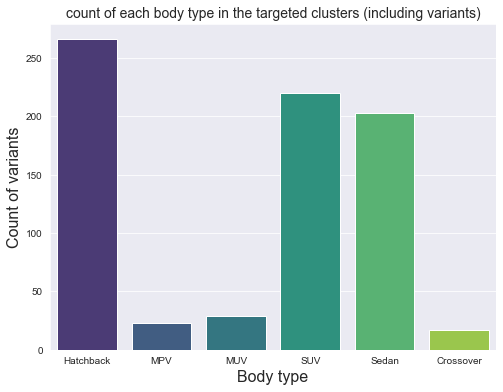

In [57]:
plt.figure(figsize=(8,6))
sns.countplot(data=df_c,x='body_type',palette='viridis')
plt.xlabel('Body type',fontsize=16)
plt.ylabel('Count of variants',fontsize=16)
plt.title('count of each body type in the targeted clusters (including variants)',fontsize=14);

> #### seems like there are too many Hatchback's followed by SUV's and Sedan's in the Maruti Suzuki Clusters, its actually important in the Indian market?

# Usefulness

##### With clustring there are too many variable taken in considration which are otherwise hard to be traced by normal methods.
##### The clusters generated by the KMeans model can be used to identify what is the strategic group that form a strong competition to the company products in the market it also show the close clusters to this group which also can be put in considration in some cases. In the present Analysis, I have found 3 clusters which are suitable to make decisions.

## Limitations of clustring

##### It worth mentioning that the clustring process itself is a little bit ambigous and features contribution to the clustering process can't be easily explained so the overall interpretability of the model forms a challenge. However, more emphasis has been given to explain the things. 

# Conclusion!

##### Clustring may be not determinant but it can be used to augment the management decision by using it side by side with human intuition like the reachability of the company to far flung areas, familiarity of the machenics about the parts of the car, take-away of the customers in response to what they spent etc. to come out with the right decision about the strategy.

# Thanks for Studying my Analysis

>>>>## Armesha Sharma